In [1]:
# Test fit of surface by scaling another surface

%reset
#pylab qt -> open windows, needs display
%pylab qt 
%load_ext autoreload
%autoreload 2

Once deleted, variables cannot be recovered. Proceed (y/[n])? y
Populating the interactive namespace from numpy and matplotlib


In [6]:
from pySurf.data2D_class import Data2D
from pySurf.data2D import data_from_txt

In [3]:
#from pySurf.fit_cylinder import *
#from pySurf.points import *
from pySurf.points import plot_points,matrix_to_points2
from pySurf.points import subtract_points,level_points
from pySurf.points import points_find_hull,crop_points
from pySurf.psd2d import calculatePSD
from pySurf.points import points_autoresample
#from calibrate_align import *
from pyProfile.profile import polyfit_profile
from plotting.multiplots import compare_images
from dataIO.fn_add_subfix import fn_add_subfix
from dataIO.span import span
#from PSDanalysis import *
from pySurf.instrumentReader import matrix4D_reader
import os
from pySurf.instrumentReader import bin_reader
from plotting.add_clickable_markers import add_clickable_markers
from plotting.backends import maximize

In [4]:
from pySurf.instrumentReader import points_reader
from pySurf.affine2D import plot_transform,find_rototrans
from pySurf.distanceTable import distanceTable


from dataIO.outliers import remove_outliers

In [24]:
%qtconsole

In [6]:
pwd

'G:\\My Drive\\POOL\\PSD\\analysis_PSD'

In [7]:
from pySurf.psd2d import calculatePSD
from utilities.imaging import fitting as fit

# Read Test Data

## WFS Data

Aligned and registered sample figure are loaded from PZT stress fit analysis.


In [7]:
outfolder=r'results\test_scalefit'  #set output

### After PZT deposition

In [11]:
wf=r'input_data\exemplar_data\C1S04_substrate_aligned.dat'
d1=Data2D(file=wf,reader=data_from_txt,delimiter=' ',units=['mm','mm','$\mu$m'],
         name='target surface',addaxis=1,center=(0,0))

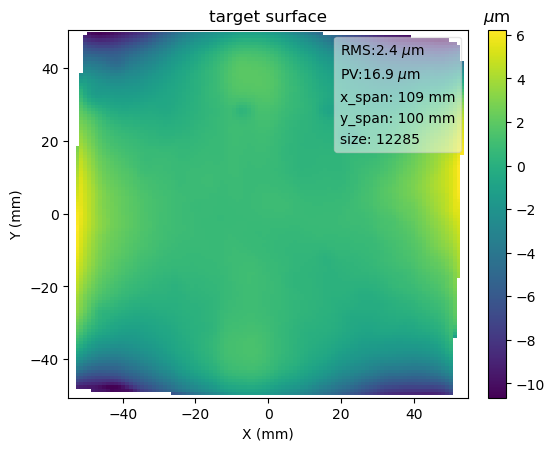

In [12]:
plt.figure(1)
plt.clf()
d1.level().plot()
display(plt.gcf())

In [13]:
from pySurf.testSurfaces import make_sag



In [41]:
#rescale by 1/4. and add random noise with PV 1 centered on 0 
d2=d1*0.25 + np.random.rand(len(d1.y),len(d1.x))-0.5

NameError: name 'name' is not defined

In [25]:
d1.data


array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])

In [21]:
np.random.rand(len(d1.y),len(d1.x))

array([[0.86347076, 0.49215041, 0.71733806, ..., 0.99035688, 0.12756788,
        0.07870344],
       [0.59317763, 0.34128825, 0.05969643, ..., 0.12403977, 0.96392103,
        0.9930578 ],
       [0.3911833 , 0.59470485, 0.67209293, ..., 0.19379258, 0.60376243,
        0.41403474],
       ...,
       [0.79616323, 0.23114077, 0.02229429, ..., 0.03266671, 0.93073277,
        0.45280411],
       [0.66052214, 0.49903688, 0.68334456, ..., 0.54523072, 0.5959165 ,
        0.27047481],
       [0.00736112, 0.0877521 , 0.36165562, ..., 0.23980754, 0.8911424 ,
        0.14616734]])

In [ ]:
plt.figure(1)
plt.clf()
d2.level().plot()
display(plt.gcf())

Figures below show the target shape and initial deviation, in form of surface and central profiles.

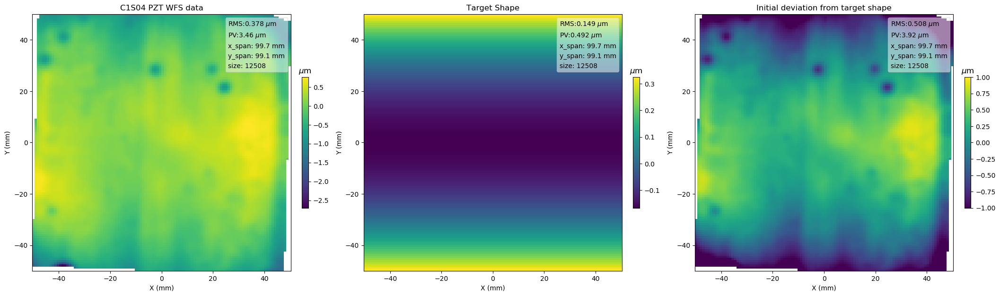

In [13]:
#calculate deviation from ideal shape
plt.figure()
maximize()

ax1=plt.subplot(131)
p1.level((1,1)).plot()

ax2=plt.subplot(132,sharex=ax1,sharey=ax1)
s1.level((1,1)).plot()

ax3=plt.subplot(133,sharex=ax1,sharey=ax1)
sdiff=(p1-s1).level((1,1))
sdiff.name='Initial deviation from target shape'
sdiff.plot()
plt.clim([-1,1])

display(plt.gcf())

In [14]:
p1.save(os.path.join(outfolder,'wfs_PZT_aligned.dat'))
s1.save(os.path.join(outfolder,'target_shape.dat'))
sdiff.save(os.path.join(outfolder,'figure_change_aligned.dat'))

plt.savefig(os.path.join(outfolder,'initial_deviation.png'))

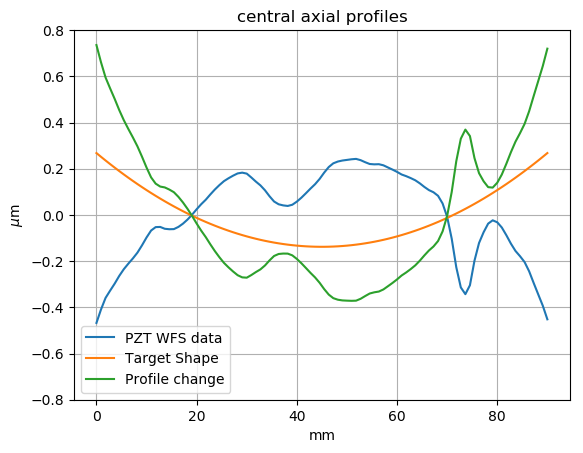

In [15]:
from pyProfile.profile import level_profile, subtract_profiles
from pySurf.points import extract_profile

## Extract axial profile
x1,y1 = level_profile(*(extract_profile(p1.topoints(),(0,-45),(0,45))))
x2,y2 = level_profile(*(extract_profile(s1.topoints(),(0,-45),(0,45))))
xd,yd = level_profile(*subtract_profiles(x2,y2,x1,y1))

plt.figure()
plt.plot(x1,y1,label='PZT WFS data')
plt.plot(x2,y2,label='Target Shape')
plt.plot(xd,yd,label='Profile change')
plt.xlabel(p1.units[0])
plt.ylabel(p1.units[2])
plt.grid(1)
plt.ylim([-0.8,0.8])
plt.legend(loc=0)
plt.title('central axial profiles')
display(plt.gcf())

In [16]:
plt.savefig(os.path.join(outfolder,'data_central_profile.png'))

## Fit PZT compensating stress with VK's uniform stress simulation

Compensating stress is calculated starting from Vladimir Kradinov's simulation 2018/06/19 corresponding to a coating with uniform integrated stress 300 MPa um.

It is determined the best fit scale coefficient $s$ that minimizes the rms of surface difference:


$S_\textrm{WFS} - s S_{target}$

The best fit value minimizes the figure rms.
This is shown below alone and in comparison with data.

In [17]:
from pySurf.instrumentReader import points_reader, fitsWFS_reader
from pySurf.affine2D import plot_transform,find_rototrans
from pySurf.distanceTable import distanceTable
from pySurf.data2D_class import Data2D
from pySurf.data2D import resample_data

In [18]:
FEAf=r'G:\My Drive\Shared by Vincenzo\Metrology logs and data\Simulations\Coating_stress\VK20180619\coat_300_MPa_um_ur.fits'  #300 MPa*um load

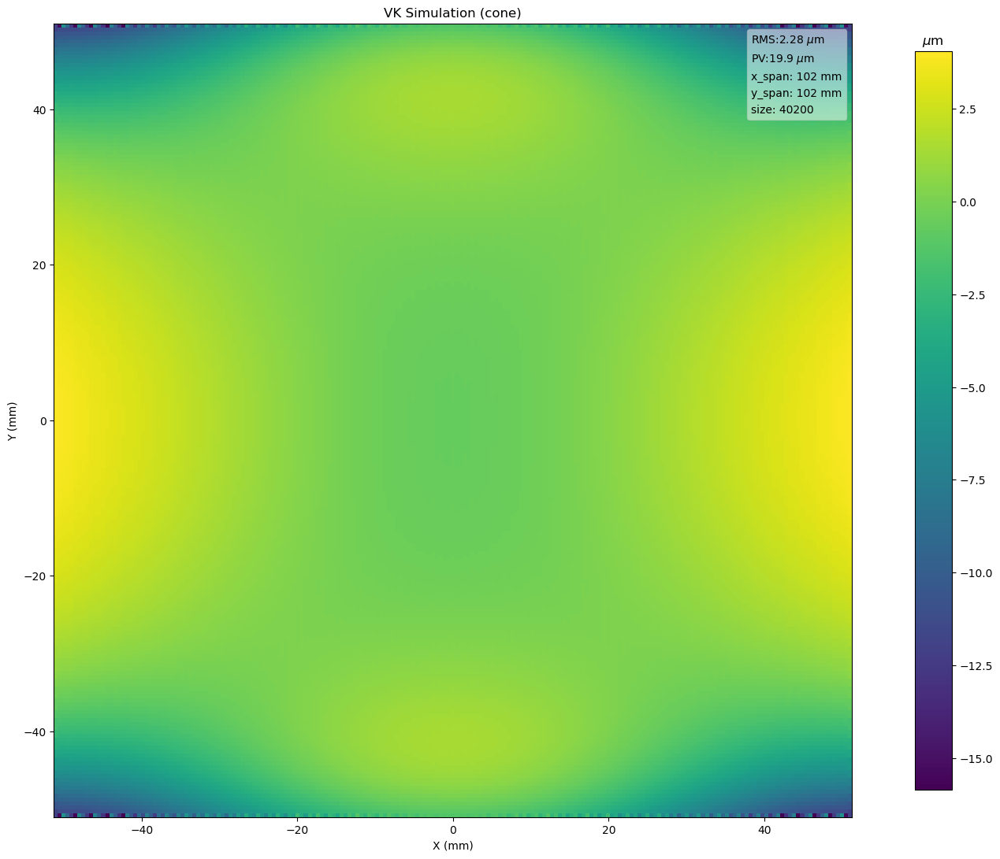

In [19]:
plt.figure(2)
plt.clf()

#manually adjust x and y scales to 4 in, adjsut units and signs.

fdata,xf,yf=fitsWFS_reader(FEAf)  #can accept ypix, ytox,..
#xf,yf,fdata=yf,xf,fdata.T

fdata=fdata-correct_misalignment(fdata)[0]
fdata=-fdata*1000000.  #m to um  
#fitsWFS_reader makes a mysterious change of sign, that is good with WK's
#data that are bump negative conversion.

#scale and center axes (100 mm square image size)
nx=fdata.shape[0]
scale=101.6/nx
xf=(xf-span(xf).sum()/2)*scale
yf=(yf-span(yf).sum()/2)*scale

df=Data2D(fdata,xf,yf,units=['mm','mm','$\mu$m'],name='VK Simulation (cone)')
#rule is: corners have same sign as delta Radius

plt.clf()
df.plot()
display(plt.gcf())
df.save(fn_add_subfix(FEAf,'','.dat',strip=True,pre=outfolder+os.path.sep))
plt.savefig(fn_add_subfix(FEAf,'','.png',strip=True,pre=outfolder+os.path.sep))

In [20]:
fn_add_subfix(FEAf,'','.dat',strip=True,pre=outfolder+os.path.sep)

'results\\C1S04_WFS_stress_compensation\\coat_300_MPa_um_ur.dat'

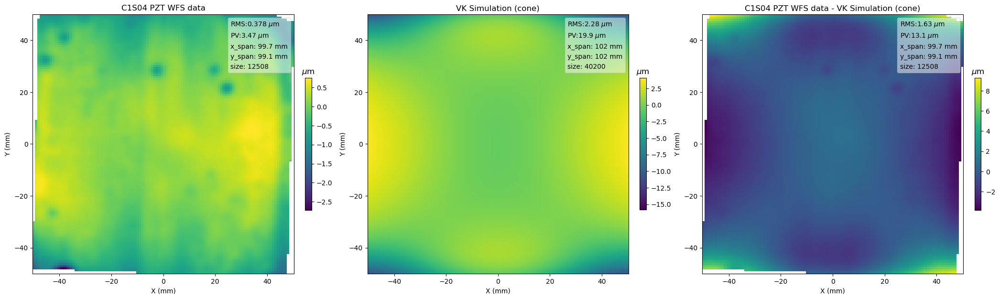

In [23]:
diff=p1-df  

plt.figure()
maximize()
ax1=plt.subplot(131)
p1.plot()

ax2=plt.subplot(132,sharex=ax1,sharey=ax1)
df.plot()

ax3=plt.subplot(133,sharex=ax1,sharey=ax1)
diff.plot()

display(plt.gcf())

In [24]:
plt.savefig(os.path.join(outfolder,'starting_data.png'))

# DO FIT

In [25]:
outfolder

'results\\C1S04_WFS_stress_compensation'

In [26]:
from stress_compensation import comp2, scale_fit2, trioptimize, fom, fom_sl
import pandas as pd

### Fit results

The best fit for stress is determined by analytical formula for simple linear regression (intercept coefficient = 0).
The fit is repeated for different azimuthal apertures. For each of them it is shown: 


1. Numerical value of best fit scale parameter and FOM of residuals 
2. Plot of surfaces and their difference on the selected region of interest (ROI)
3. Plot of the entire surface full aperture


Each plot reports values for the ROI (small box) and for the entire surface (larger box) (the two are identical for the crop image at point 2) 

Used functions (for who is interested in details).

In [27]:
print(help(trioptimize))
print('---------------------------')
print(help(scale_fit2))
print('---------------------------')
print(help(fom))
print('---------------------------')
print(help(fom_sl))

Help on function trioptimize in module stress_compensation:

trioptimize(d1, d2, fom, testvals=None, rois=None, outfile=None, noplot=False, dis=True)
    run optimizations with scale_fit2 for a set of cases
    corresponding to the values in matching lists of testvals (array of scaling test values) 
    and rois ([[xmin,xmax],[ymin,ymax]]). Returns a list of best scaling values for each case.
    
    d1 and d2 are Data2D objects.

None
---------------------------
Help on function scale_fit2 in module stress_compensation:

scale_fit2(d1, d2, testval, fom=<function fom at 0x000001CD74F3E268>, outfile='', roi=None, crop=False, dis=True)
    p1 and df are Data2D objects. Returns value for scaling tbest of d2
    that minimizes fom(d1-d2*tbest). e.g. fom = rms of surface/slope.
    
    if `roi` is passed, fom is calculated on the roi only.
    `crop` flag controls the plotting. If True, only the roi is plotted and 
    color scale is adjusted accordingly. Otherwise, entire region is plott

In [28]:
allres=pd.DataFrame()

In [29]:
os.makedirs(os.path.join(outfolder,'fits'),exist_ok=True)

unscaled fom: 1.6313974010512182


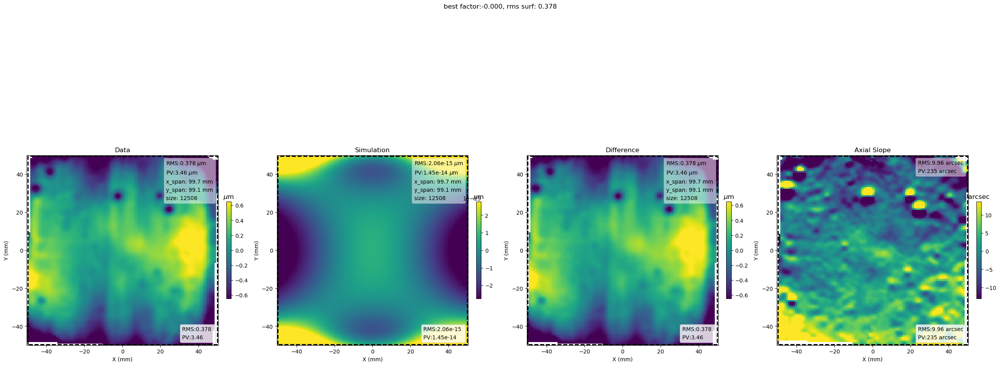

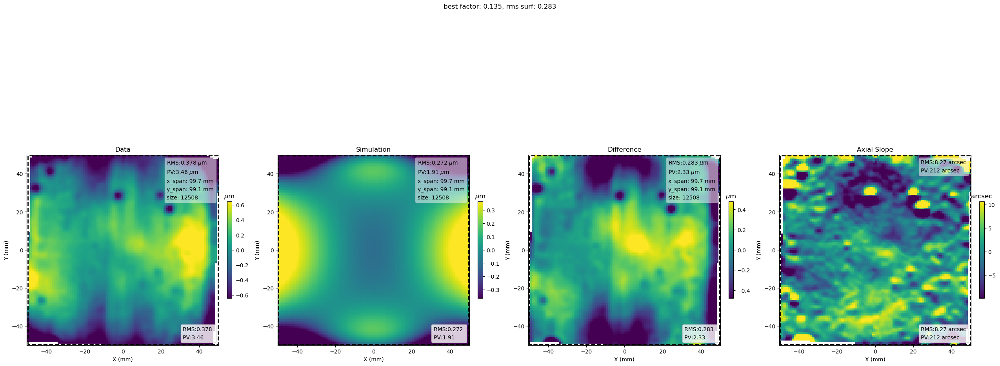

0.13509911216297874

In [61]:
scale_fit2(p1,df,testval=None,fom=fom,outfile='',roi=None, crop=False, dis= True)

unscaled fom: 1.6313974010512182
0 0.1345 0.28278653474455745
1 0.1346 0.2827858646428934
2 0.1347 0.28278531657370776
3 0.13479999999999998 0.2827848905377101
4 0.13489999999999996 0.2827845865354521
5 0.13499999999999995 0.2827844045673271
6 0.13509999999999994 0.2827843446335708
7 0.13519999999999993 0.28278440673426086
8 0.13529999999999992 0.2827845908693168
9 0.1353999999999999 0.2827848970385002
10 0.1354999999999999 0.2827853252414147


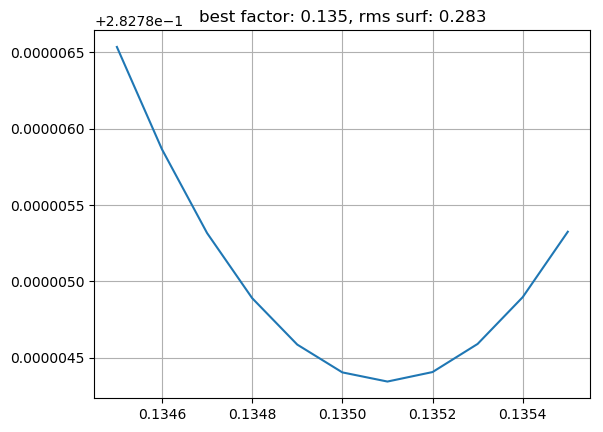

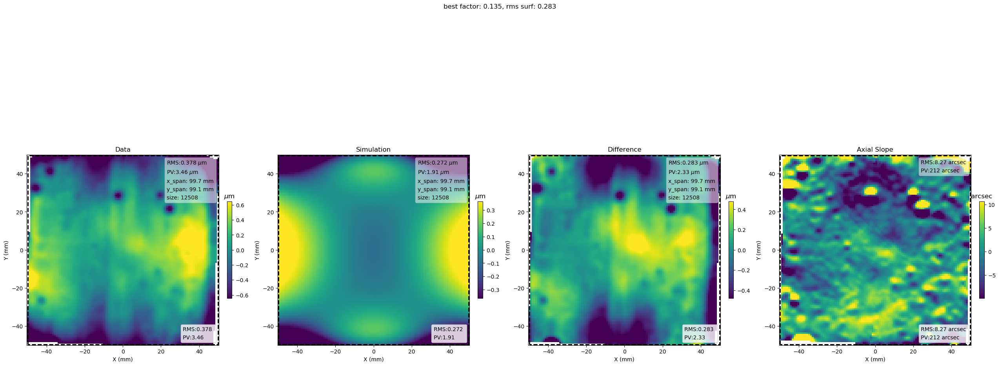

0.13509999999999994

In [59]:
scale_fit2(p1,df,testval=np.arange(0.1345,0.1355,0.0001),fom=fom,outfile='',roi=None, crop=False, dis= True)

In [62]:
scales=trioptimize(p1,df,fom=fom,
           rois=[None],dis =False,
           outfile=os.path.join(outfolder,'fits','wfs_test_roi'))
#allres = allres.append(scales)
scales

,tbest,testval,roi,rms_roi
wfs_test_roi_crop01,0.135099,NaN,NaN,0.282784



===

CROP: [-10.00:10.00] [-45.00:45.00]
TEST RANGE: [None None]
unscaled fom: 1.6324446528130139


<Figure size 640x480 with 0 Axes>

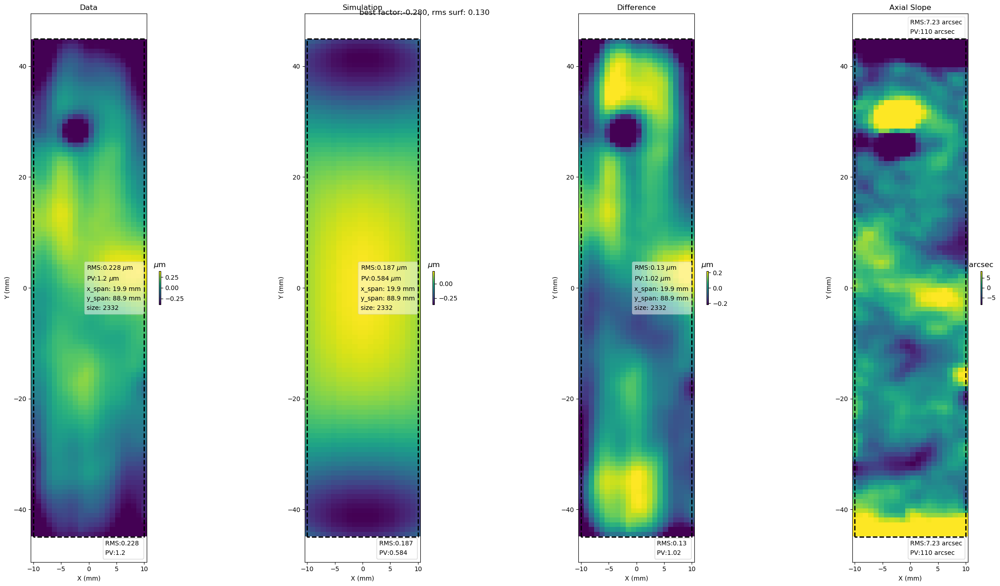

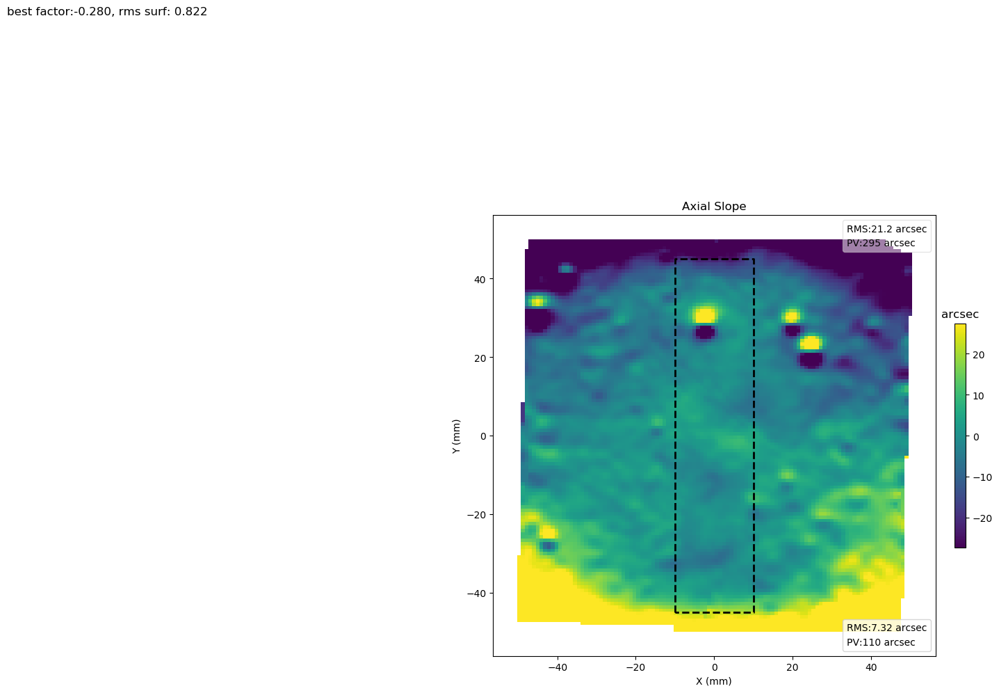

BEST SCALE: -0.280

===

CROP: [-20.00:20.00] [-45.00:45.00]
TEST RANGE: [None None]
unscaled fom: 1.6324446528130139


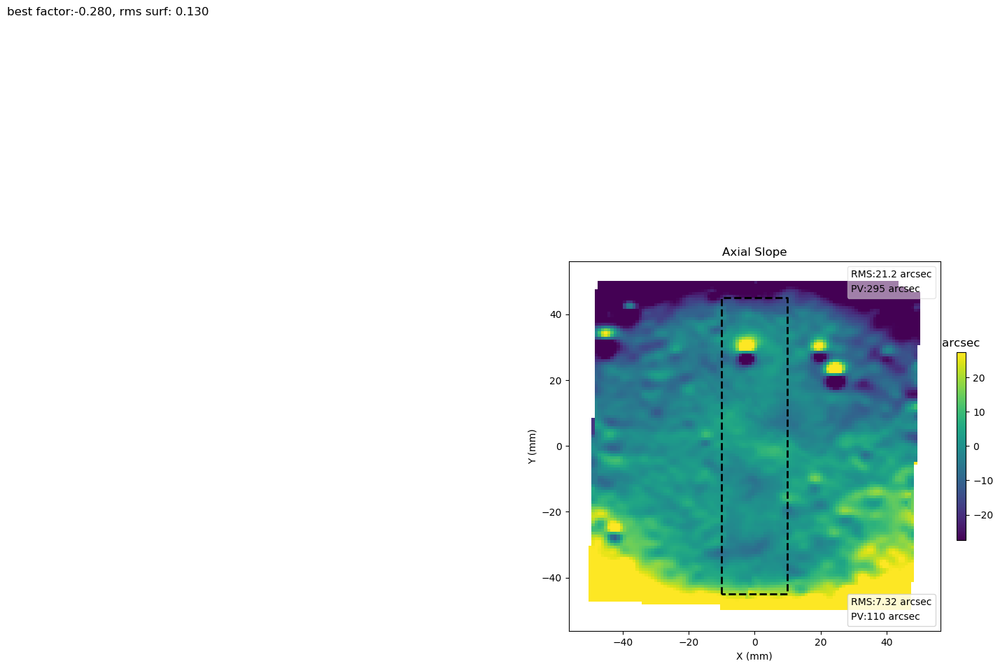

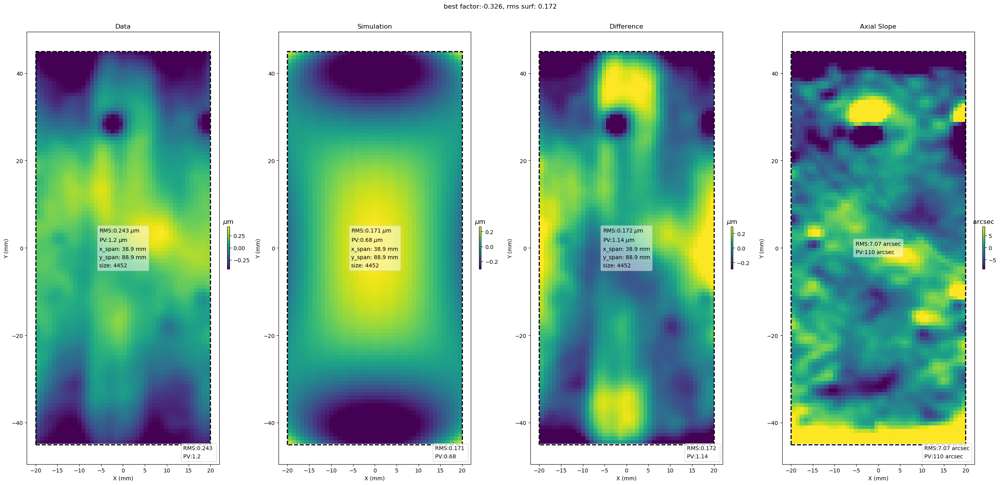

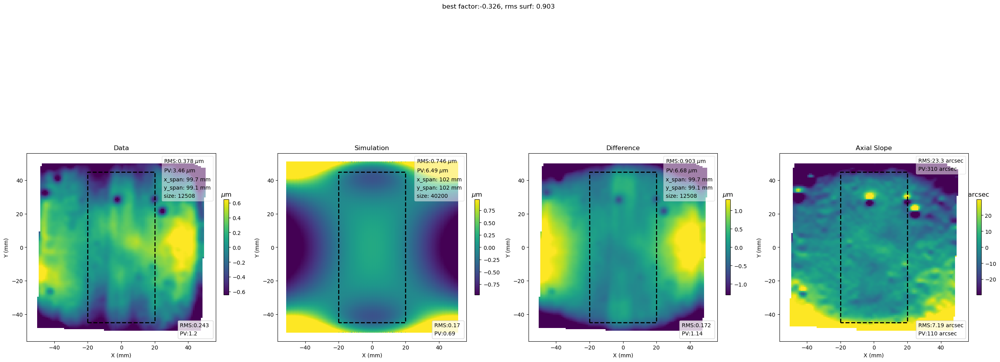

BEST SCALE: -0.326

===

CROP: [-30.00:30.00] [-45.00:45.00]
TEST RANGE: [None None]
unscaled fom: 1.6324446528130139


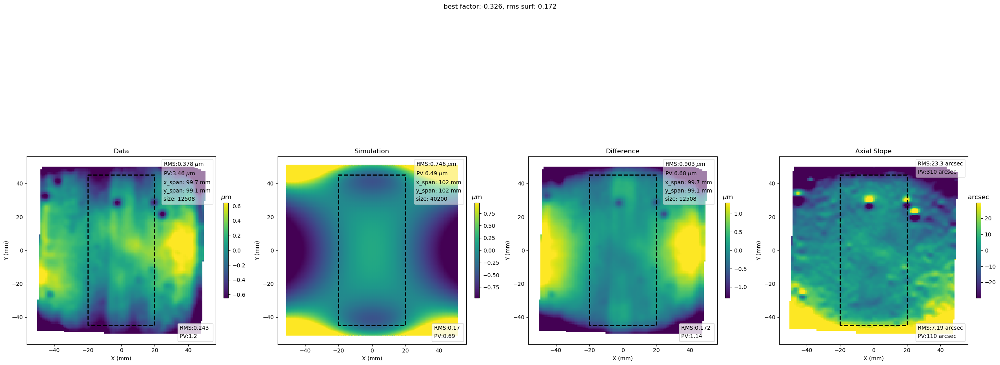

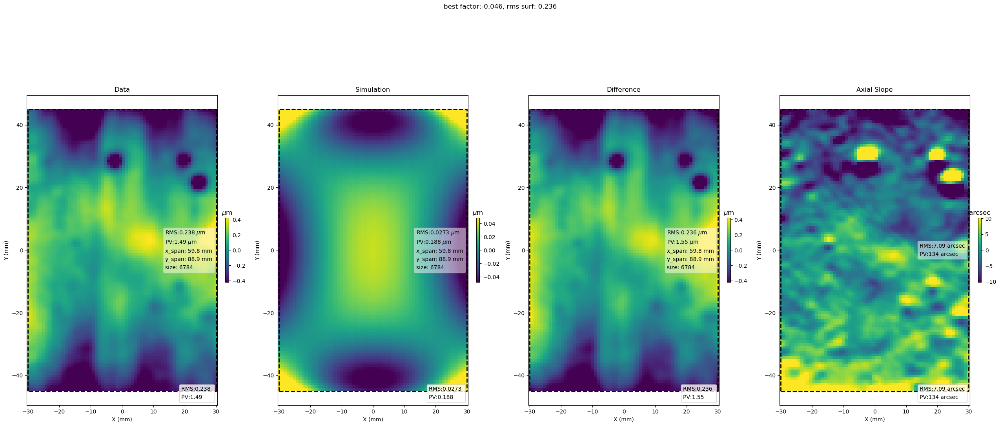

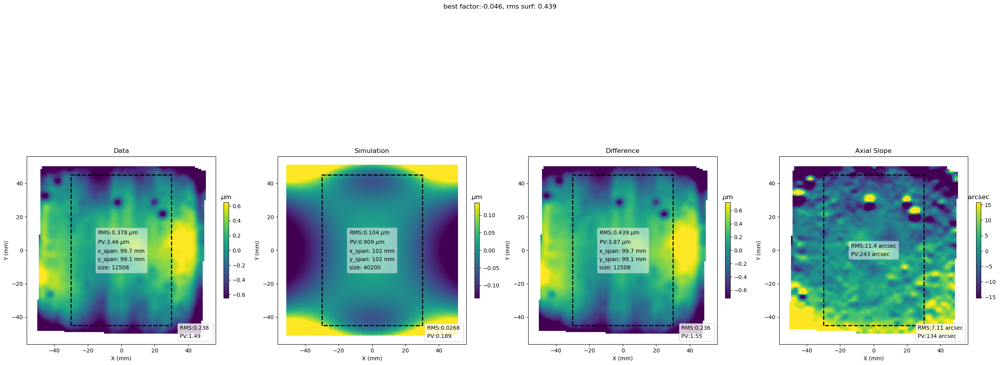

BEST SCALE: -0.046

===

CROP: [-37.00:37.00] [-45.00:45.00]
TEST RANGE: [None None]
unscaled fom: 1.6324446528130139


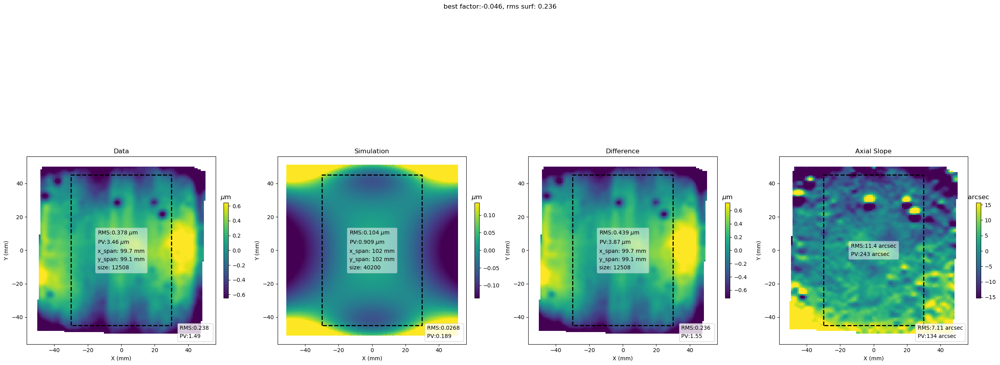

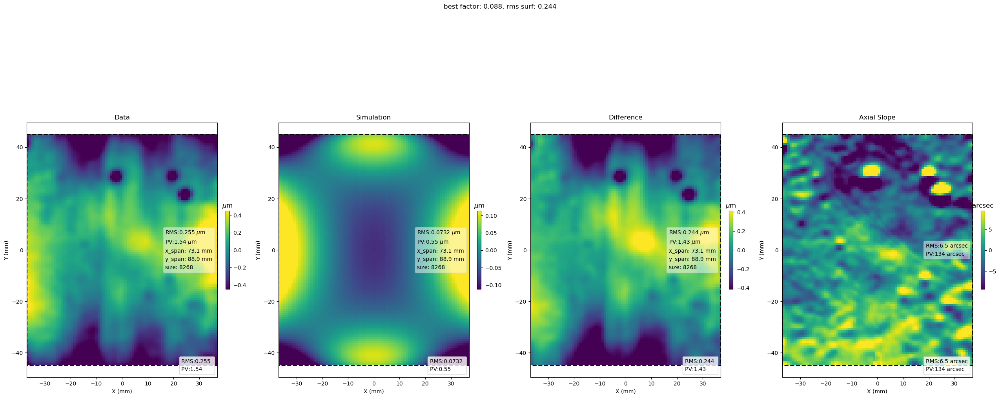

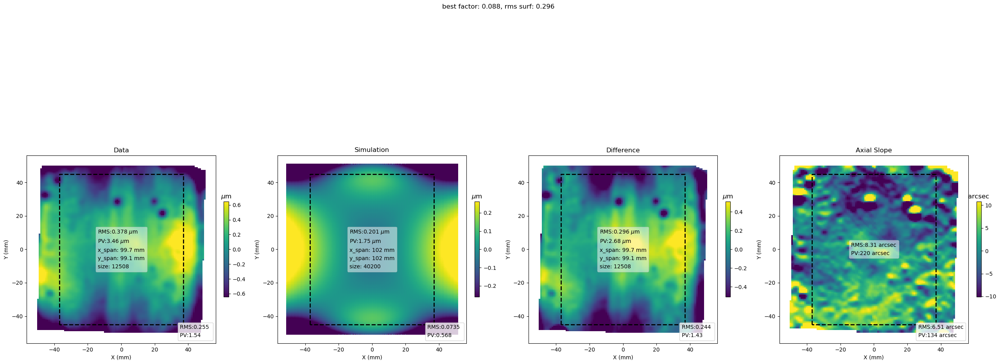

BEST SCALE: 0.088

===

FULL APERTURE
TEST RANGE: [None None]
unscaled fom: 1.6313974010512182


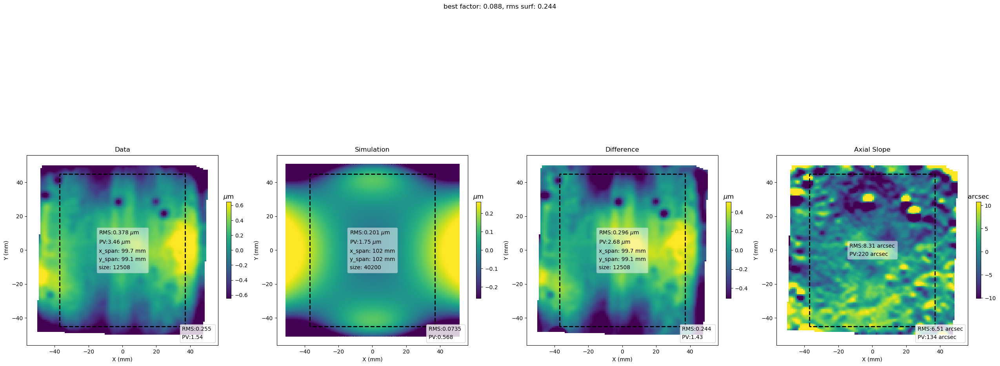

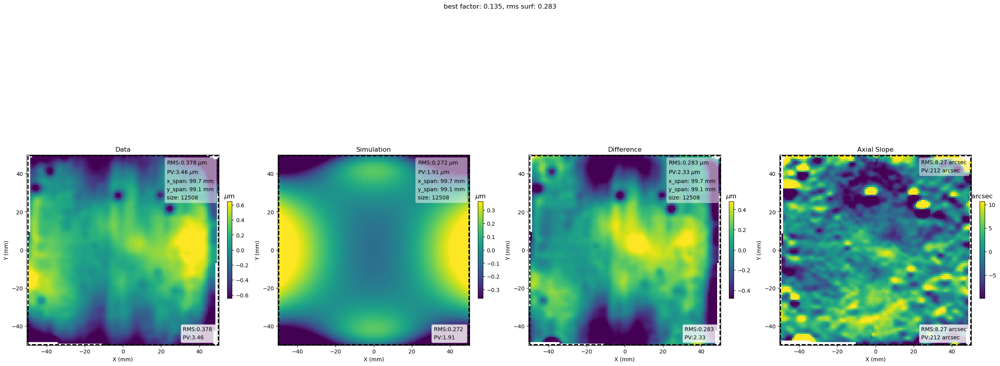

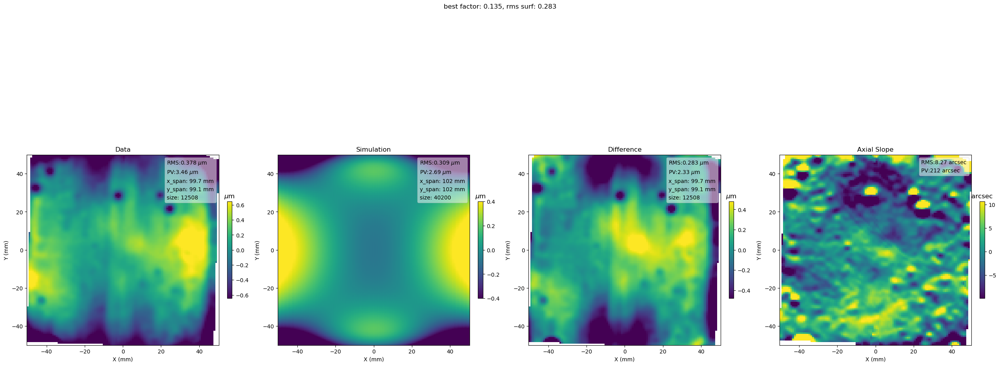

BEST SCALE: 0.135

===
SUMMARY:
CROP: [-10.00:10.00] [-45.00:45.00] --> BEST SCALE:  -0.2803289095522195
CROP: [-20.00:20.00] [-45.00:45.00] --> BEST SCALE:  -0.32643243068650313
CROP: [-30.00:30.00] [-45.00:45.00] --> BEST SCALE:  -0.045708894076315856
CROP: [-37.00:37.00] [-45.00:45.00] --> BEST SCALE:  0.08810537990318089
FULL APERTURE--> BEST SCALE:  0.13509911216297874


,tbest,testval,roi,rms_roi
wfs_test_roi_crop01,-0.280329,None,"[[-10, 10], [-45, 45]]",0.129960
wfs_test_roi_crop02,-0.326432,None,"[[-20, 20], [-45, 45]]",0.172074
wfs_test_roi_crop03,-0.045709,None,"[[-30, 30], [-45, 45]]",0.236187
wfs_test_roi_crop04,0.088105,None,"[[-37, 37], [-45, 45]]",0.243754
wfs_test_roi_crop05,0.135099,NaN,NaN,0.282784


In [63]:
#ROUGH FIT - set dis to True in call to show results

scales=trioptimize(p1,df,fom=fom,
           rois=[[[-10,10],[-45,45]],[[-20,20],[-45,45]],[[-30,30],[-45,45]],
                 [[-37,37],[-45,45]],None],dis =True,
                  outfile=os.path.join(outfolder,'fits','wfs_test_roi'))
#allres = allres.append(scales)
scales


===

CROP: [-10.00:10.00] [-45.00:45.00]
TEST RANGE: [-0.285 -0.276]
unscaled fom: 1.6324446528130139
0 -0.285 0.12999708407542598
1 -0.284 0.12998278852916262
2 -0.283 0.12997191922312196
3 -0.282 0.12996447701694316
4 -0.28099999999999997 0.1299604624993865
5 -0.27999999999999997 0.12995987598810035
6 -0.27899999999999997 0.1299627175294957
7 -0.27799999999999997 0.12996898689872763
8 -0.27699999999999997 0.1299786835997844
9 -0.27599999999999997 0.12999180686568354


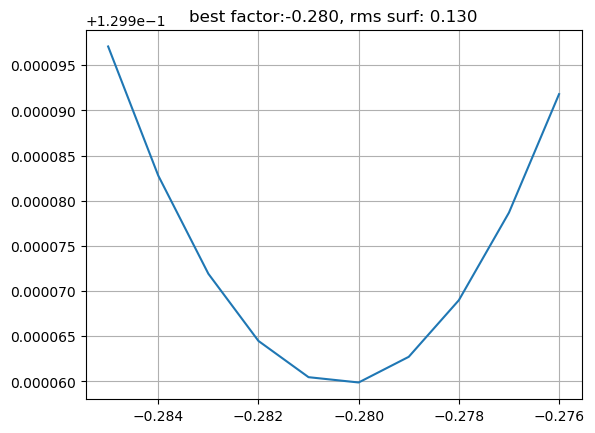

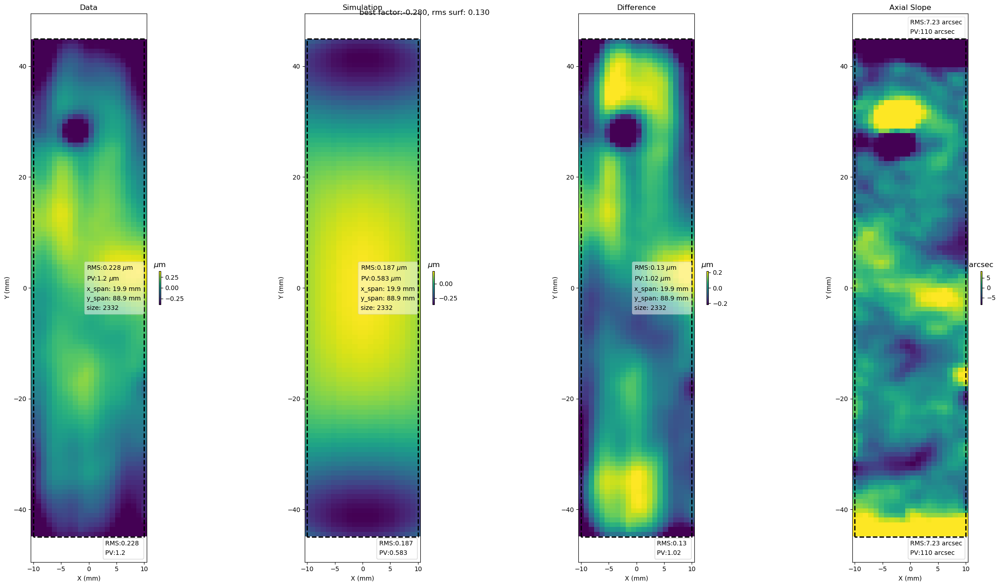

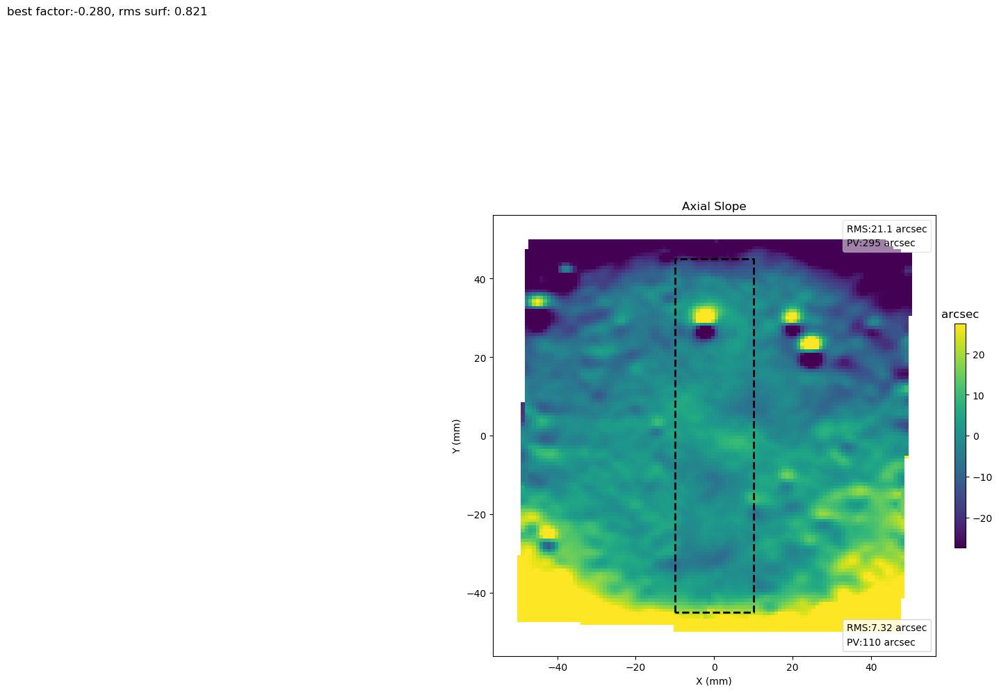

BEST SCALE: -0.280

===

CROP: [-20.00:20.00] [-45.00:45.00]
TEST RANGE: [-0.33 -0.32]
unscaled fom: 1.6324446528130139
0 -0.33 0.17208450592967137
1 -0.329 0.17207961892052812
2 -0.328 0.17207632495410205
3 -0.327 0.17207462412187838
4 -0.326 0.17207451647109803
5 -0.325 0.17207600200475115
6 -0.324 0.1720790806815765
7 -0.323 0.17208375241606738
8 -0.322 0.17209001707848337
9 -0.321 0.17209787449486844
10 -0.32 0.17210732444707502


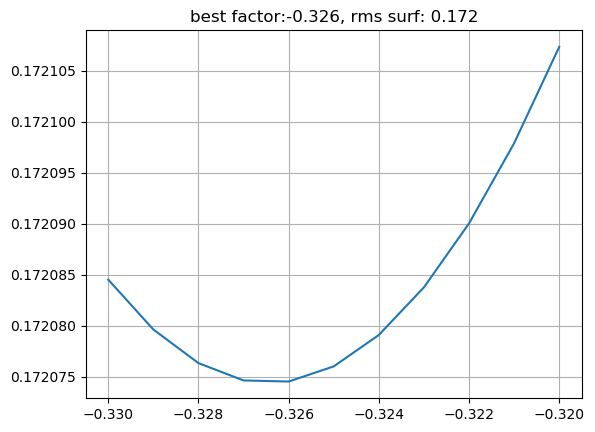

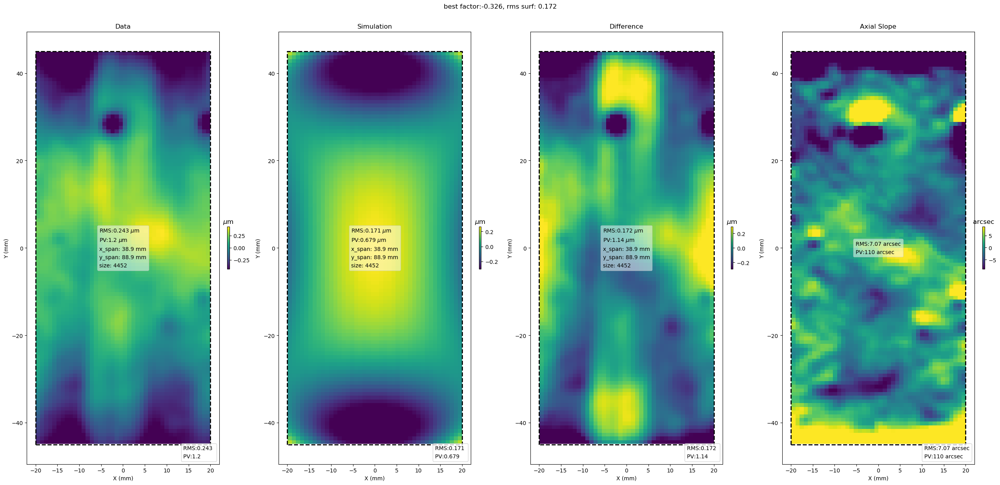

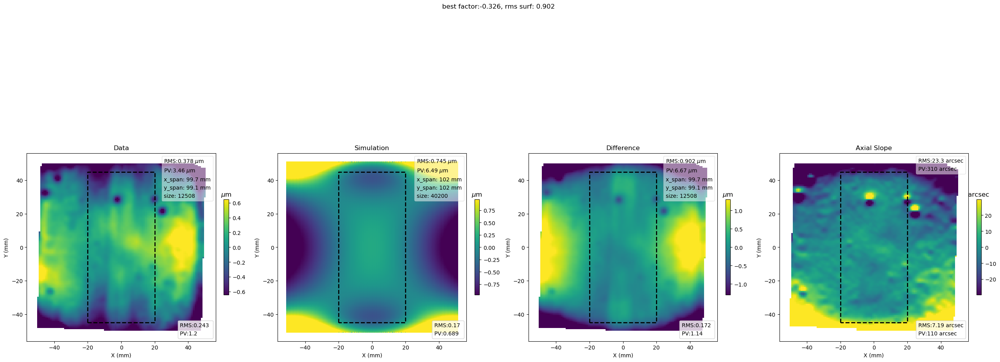

BEST SCALE: -0.326

===

CROP: [-30.00:30.00] [-45.00:45.00]
TEST RANGE: [-0.05 -0.04]
unscaled fom: 1.6324446528130139
0 -0.05 0.23620062239164002
1 -0.049 0.236194904890962
2 -0.048 0.23619069543712845
3 -0.047 0.2361879941107707
4 -0.046 0.23618680096363528
5 -0.045 0.23618711601857878
6 -0.044 0.23618893926956577
7 -0.043 0.23619227068166937
8 -0.041999999999999996 0.2361971101910746
9 -0.040999999999999995 0.23620345770508439
10 -0.039999999999999994 0.2362113131021287


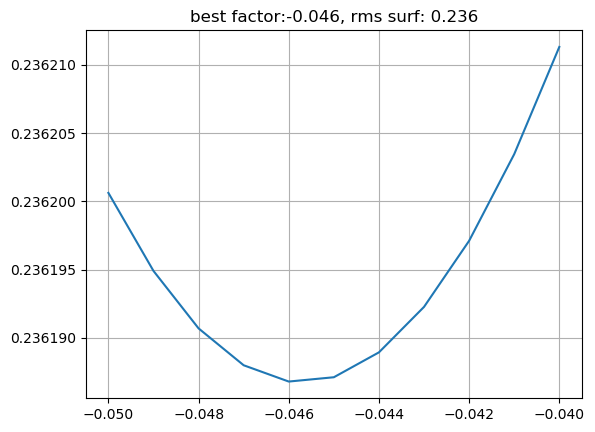

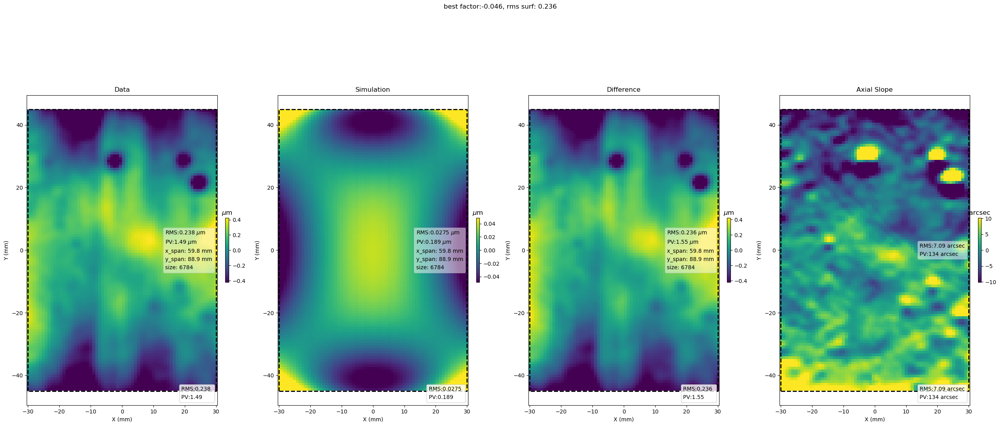

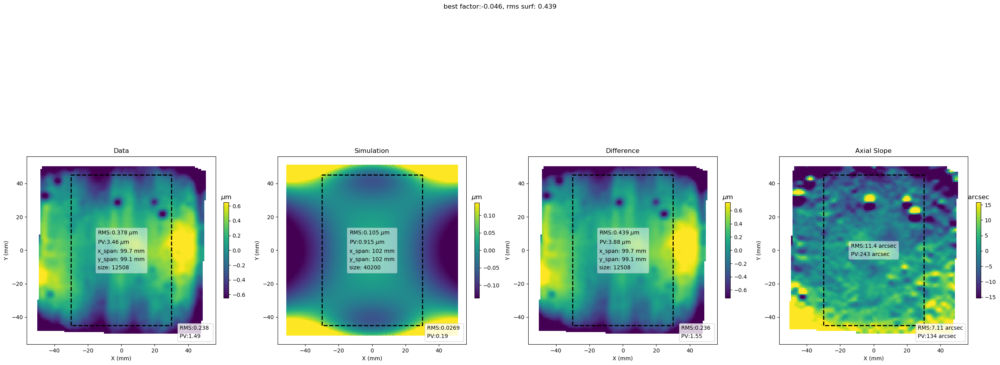

BEST SCALE: -0.046

===

CROP: [-37.00:37.00] [-45.00:45.00]
TEST RANGE: [0.085 0.089]
unscaled fom: 1.6324446528130139
0 0.085 0.2437674962602031
1 0.08600000000000001 0.24376011492633848
2 0.08700000000000001 0.24375556659348305
3 0.08800000000000001 0.24375385142022424
4 0.08900000000000001 0.24375496946636835


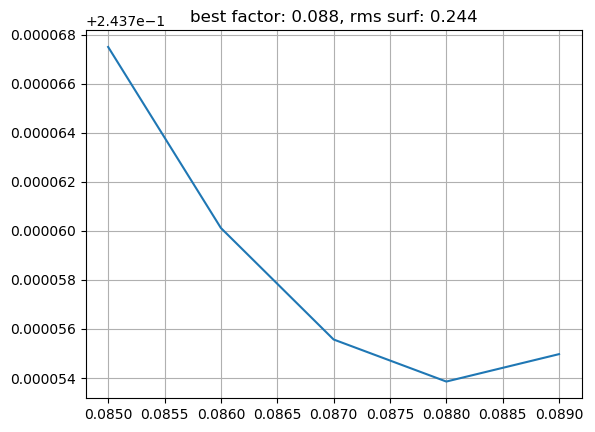

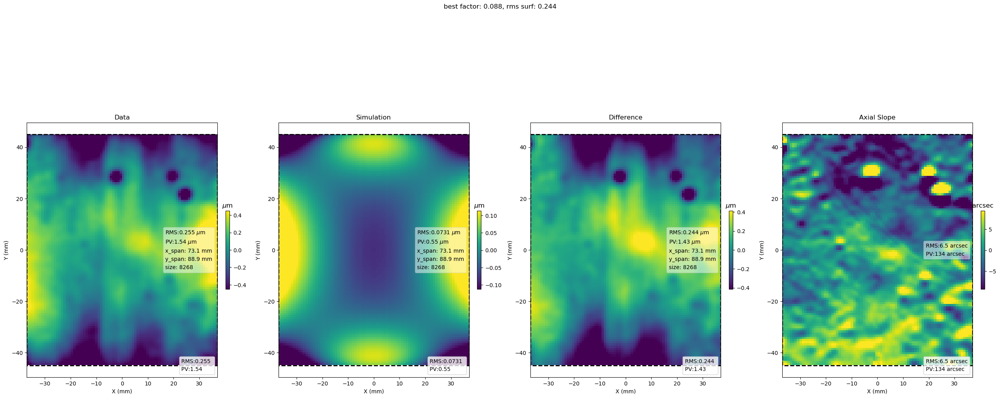

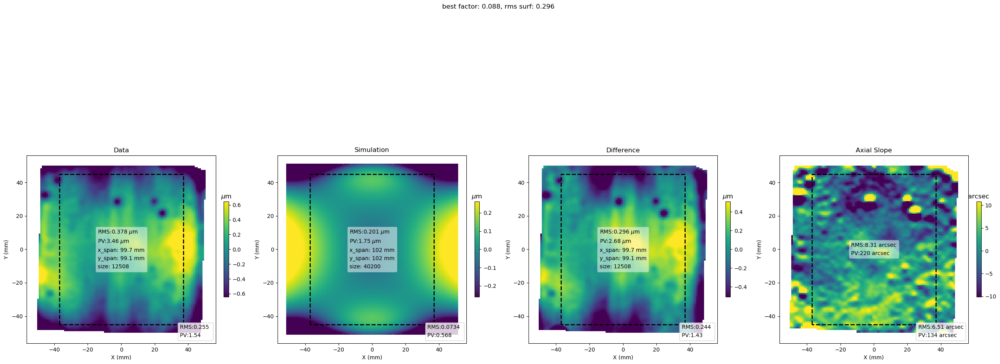

BEST SCALE: 0.088

===

FULL APERTURE
TEST RANGE: [0.13 0.14]
unscaled fom: 1.6313974010512182
0 0.13 0.28294295071234754
1 0.131 0.2828868515956357
2 0.132 0.2828429425326017
3 0.133 0.2828112292011019
4 0.134 0.2827917157041625
5 0.135 0.2827844045673271
6 0.136 0.2827892967370224
7 0.137 0.2828063915799462
8 0.138 0.2828356868834768
9 0.139 0.28287717885710495
10 0.14 0.28293086213488466


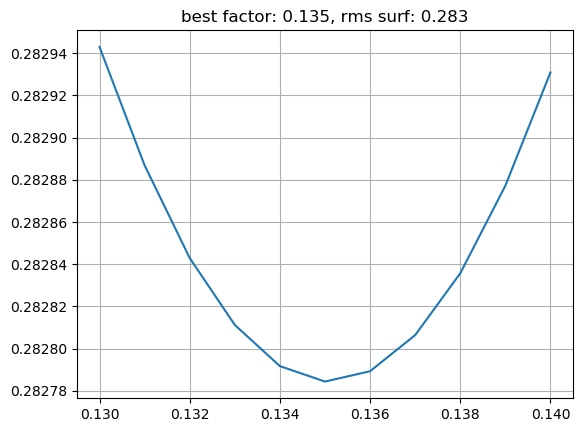

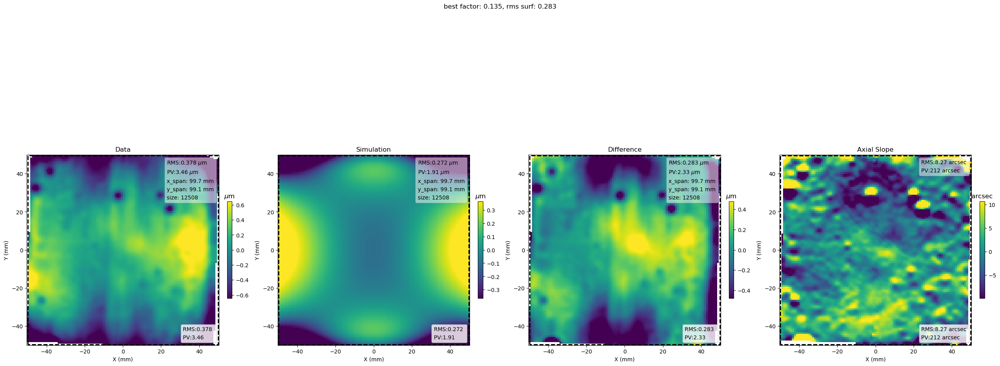

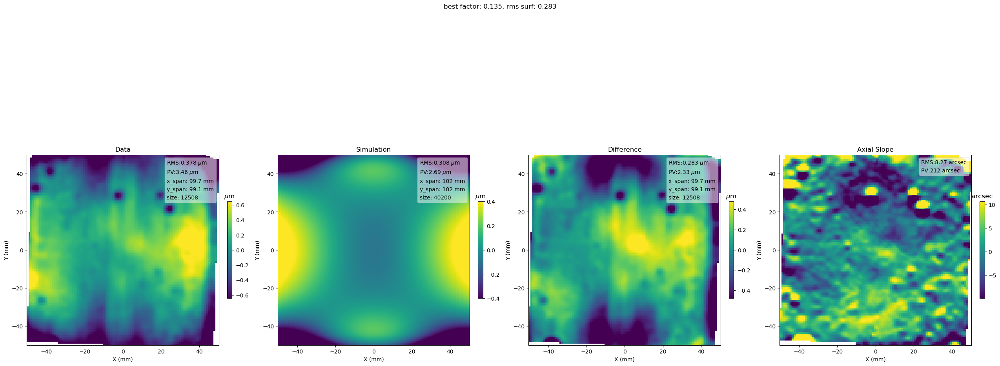

BEST SCALE: 0.135

===
SUMMARY:
CROP: [-10.00:10.00] [-45.00:45.00] --> BEST SCALE:  -0.27999999999999997
CROP: [-20.00:20.00] [-45.00:45.00] --> BEST SCALE:  -0.326
CROP: [-30.00:30.00] [-45.00:45.00] --> BEST SCALE:  -0.046
CROP: [-37.00:37.00] [-45.00:45.00] --> BEST SCALE:  0.08800000000000001
FULL APERTURE--> BEST SCALE:  0.135


In [66]:
#FINE TUNING

allres=trioptimize(p1,df,fom=fom,testvals=[np.arange(-0.285,-0.275,0.001),
                                  np.arange(-0.33,-0.32,0.001),
                                  np.arange(-0.05,-0.04,0.001),
                                  np.arange(0.085,0.090,0.001),
                                  np.arange(0.13,0.14,0.001)],
           rois=[[[-10,10],[-45,45]],[[-20,20],[-45,45]],[[-30,30],[-45,45]],
                 [[-37,37],[-45,45]],None],
                  outfile=os.path.join(outfolder,'fits','wfs_test_roi'))


In [64]:
allres[['tbest','rms_roi','roi']]

,tbest,rms_roi,roi
wfs_test_roi,0.48,0.205576,"[[-10, 10], [-45, 45]]"
wfs_test_roi,0.41,0.401202,"[[-20, 20], [-45, 45]]"
wfs_test_roi,0.74,0.674395,"[[-30, 30], [-45, 45]]"
wfs_test_roi,0.84,0.765710,"[[-37, 37], [-45, 45]]"
wfs_test_roi,1.02,0.800055,None


In [65]:
allres[['tbest','rms_roi','roi']].to_csv(os.path.join(outfolder,'all_stats.txt'))

## Plot Best

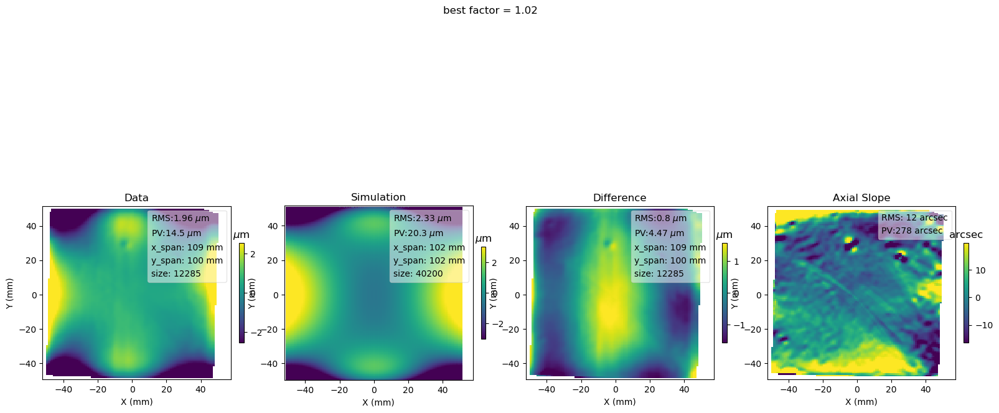

In [66]:
plt.close('all')
comp2(p1,df*1.02)
plt.suptitle('best factor = 1.02')
display(plt.gcf())

In [67]:
plt.savefig(os.path.join(outfolder,'best_fit_VK.png'))

## REPEAT FIT USING VM STRESS DATA

The exact same procedure is repeated on a different set of data by Vanessa Marquez, representing a PZT film on back of substrate, having an integrated stress of 150 MPa um. It is then expected to find values that are about double of previous ones.

In [68]:
from pySurf.instrumentReader import FEAreader

In [69]:
FEAf2=r'G:\My Drive\Shared by Vincenzo\Metrology logs and data\Simulations\CoatingStress_Analysis\220mm_CoatingStress\Primary\220mmROC_Case1_MirrorSurfaceOnly.csv'

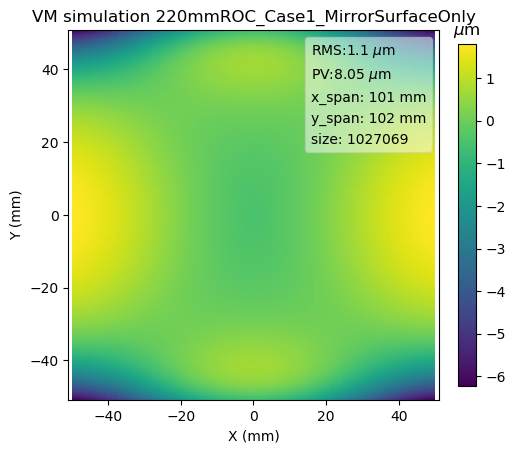

In [70]:
plt.figure(2)
plt.clf()

#manually adjust x and y scales to 4 in, adjsut units and signs.

fdata,xf,yf=points_autoresample(FEAreader(FEAf2))  #can accept ypix, ytox,..
#xf,yf,fdata=yf,xf,fdata.T

fdata=fdata-correct_misalignment(fdata)[0]
fdata=fdata*1000.  #m to um  
#fitsWFS_reader makes a mysterious change of sign, that is good with WK's
#data that are bump negative conversion.

#scale and center axes (100 mm square image size)
nx=fdata.shape[0]
scale=1.016
xf=(xf-span(xf).sum()/2)*scale
yf=(yf-span(yf).sum()/2)*scale

df=Data2D(fdata,xf,yf,units=['mm','mm','$\mu$m'],name='VM simulation 220mmROC_Case1_MirrorSurfaceOnly')
#rule is: corners have same sign as delta Radius

plt.clf()
df.plot()
display(plt.gcf())
df.save(fn_add_subfix(FEAf2,'','.dat',strip=True,pre=outfolder+os.path.sep))
plt.savefig(fn_add_subfix(FEAf2,'','.png',strip=True,pre=outfolder+os.path.sep))

In [71]:
os.makedirs(os.path.join(outfolder,'fits2'),exist_ok=True)

In [72]:
#ROUGH FIT

scales=trioptimize(p1,df,fom=fom,testvals=[np.arange(0.8,1.3,0.1),
                                  np.arange(0.5,1.1,0.1),
                                  np.arange(0.8,1.4,0.1),
                                  np.arange(1.3,1.9,0.1),
                                  np.arange(1.8,2.4,0.1)],
           rois=[[[-10,10],[-45,45]],[[-20,20],[-45,45]],[[-30,30],[-45,45]],
                 [[-37,37],[-45,45]],None],dis=False,
                  outfile=os.path.join(outfolder,'fits2','wfs_test_roi'))
#allres = allres.append(scales)
scales

,tbest,testval,roi,rms_roi
wfs_test_roi,0.9,"[0.8, 0.9, 1.0, 1.1, 1.2]","[[-10, 10], [-45, 45]]",0.212270
wfs_test_roi,0.7,"[0.5, 0.6, 0.7, 0.7999999999999999, 0.89999999...","[[-20, 20], [-45, 45]]",0.417399
wfs_test_roi,1.1,"[0.8, 0.9, 1.0, 1.1, 1.2, 1.2999999999999998]","[[-30, 30], [-45, 45]]",0.722257
wfs_test_roi,1.4,"[1.3, 1.4000000000000001, 1.5000000000000002, ...","[[-37, 37], [-45, 45]]",0.830354
wfs_test_roi,1.9,"[1.8, 1.9000000000000001, 2.0, 2.1000000000000...",None,0.878715



===

CROP: [-10.00:10.00] [-45.00:45.00]
TEST RANGE: [0.88 0.92]
unscaled fom: 1.2185415385392677
0 0.88 0.2124179753333993
1 0.89 0.21231473896270084
2 0.9 0.2122696557830656
3 0.91 0.21228276284504285
4 0.92 0.21235404937365912


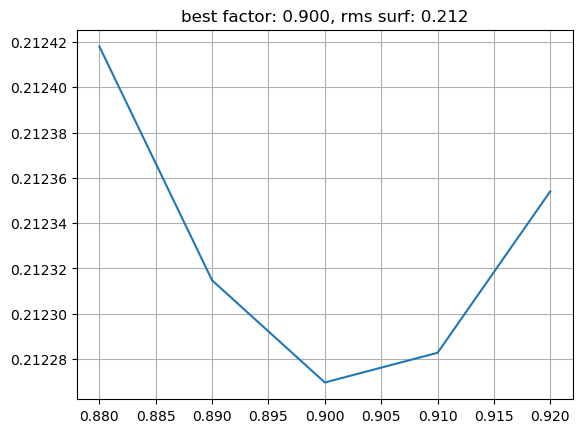

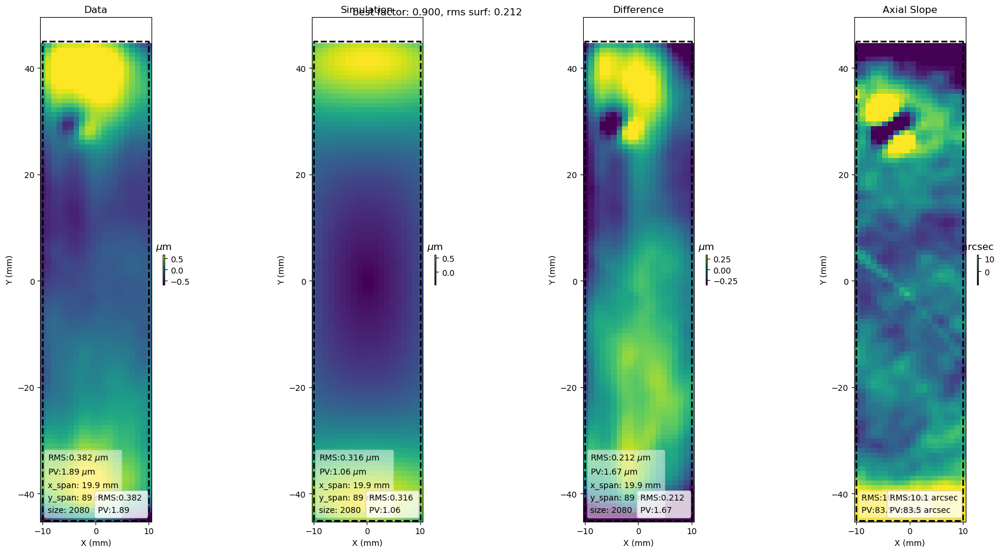

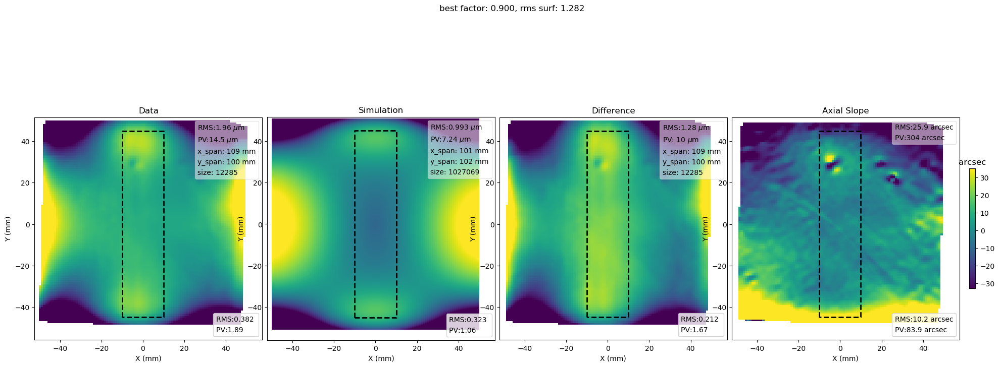

BEST SCALE: 0.900

===

CROP: [-20.00:20.00] [-45.00:45.00]
TEST RANGE: [0.64 0.7 ]
unscaled fom: 1.2185415385392677
0 0.64 0.41735072561486447
1 0.65 0.4173124449846069
2 0.66 0.4172926656152855
3 0.67 0.4172913901377473
4 0.68 0.4173086187216602
5 0.6900000000000001 0.4173443490754002
6 0.7000000000000001 0.41739857644757533


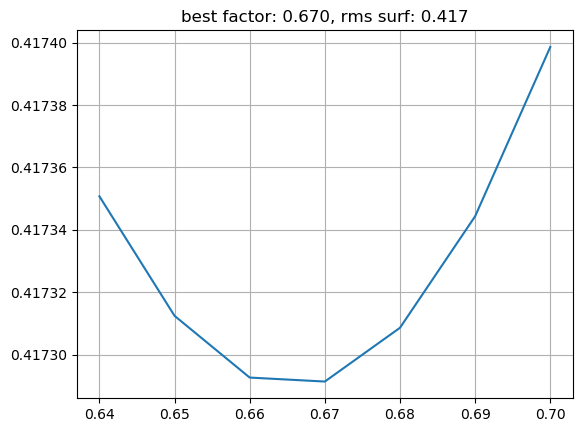

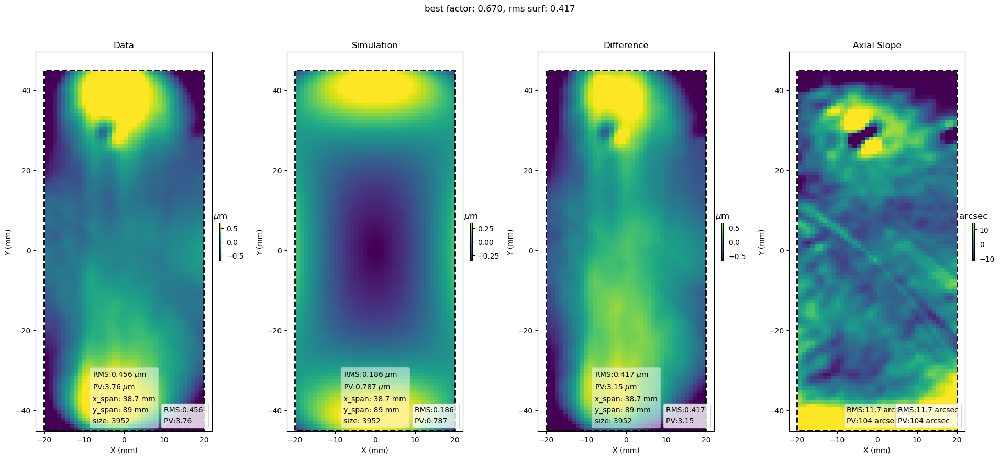

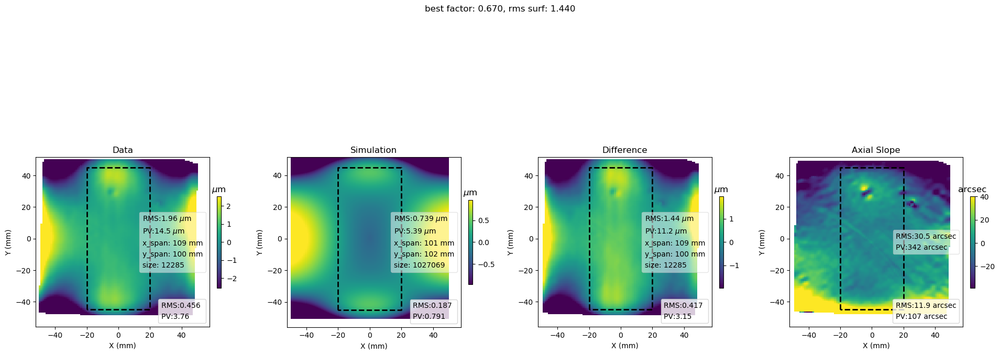

BEST SCALE: 0.670

===

CROP: [-30.00:30.00] [-45.00:45.00]
TEST RANGE: [1.09 1.13]
unscaled fom: 1.2185415385392677
0 1.09 0.7222763047157712
1 1.1 0.7222568796593288
2 1.11 0.7222517431164446
3 1.12 0.7222608953919675
4 1.1300000000000001 0.7222843359427246


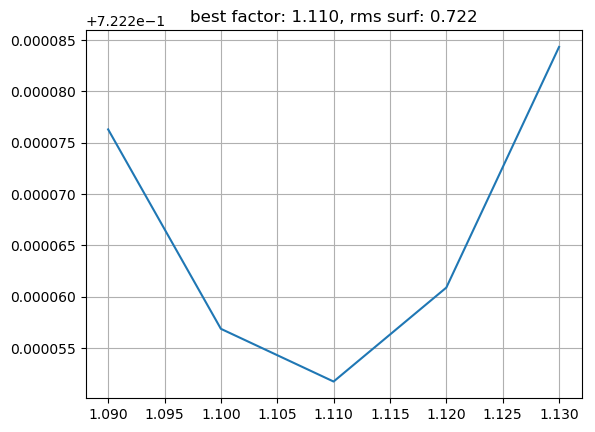

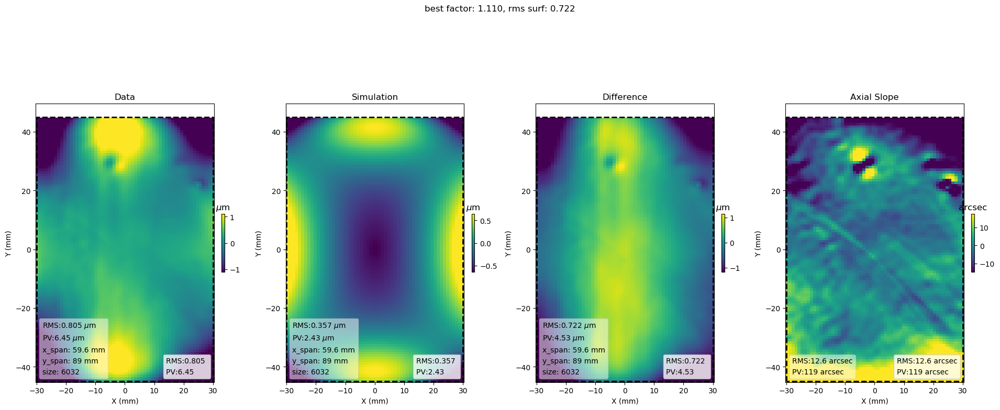

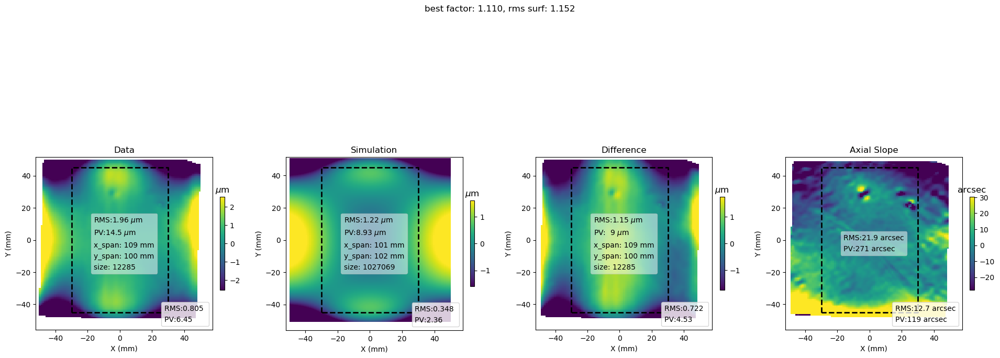

BEST SCALE: 1.110

===

CROP: [-37.00:37.00] [-45.00:45.00]
TEST RANGE: [1.38 1.42]
unscaled fom: 1.2185415385392677
0 1.38 0.8304196731366982
1 1.39 0.8303753023637096
2 1.4 0.8303537134877286
3 1.41 0.8303549082857145
4 1.42 0.8303788866593196


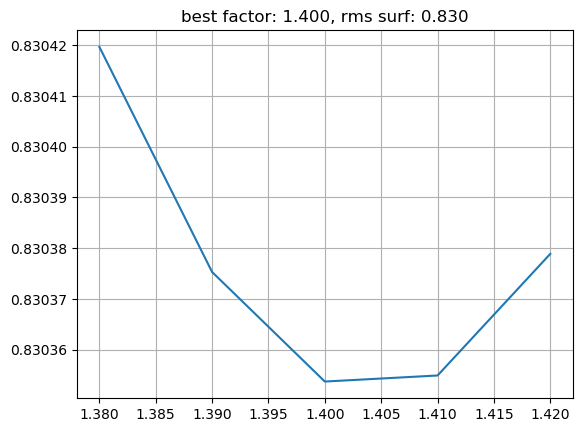

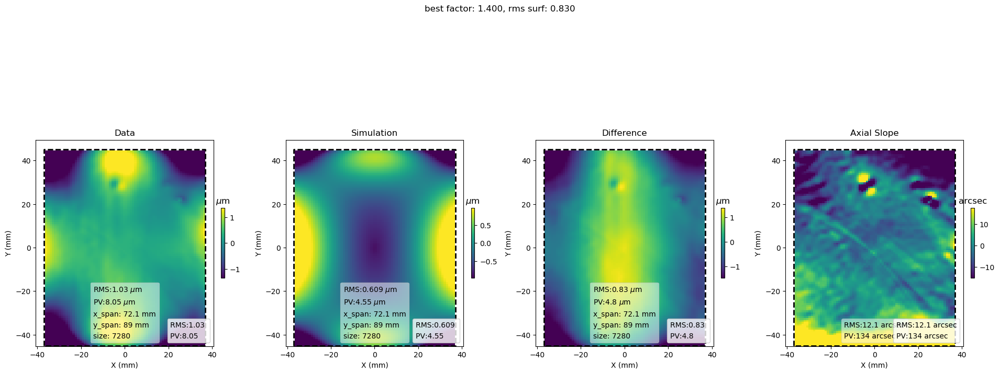

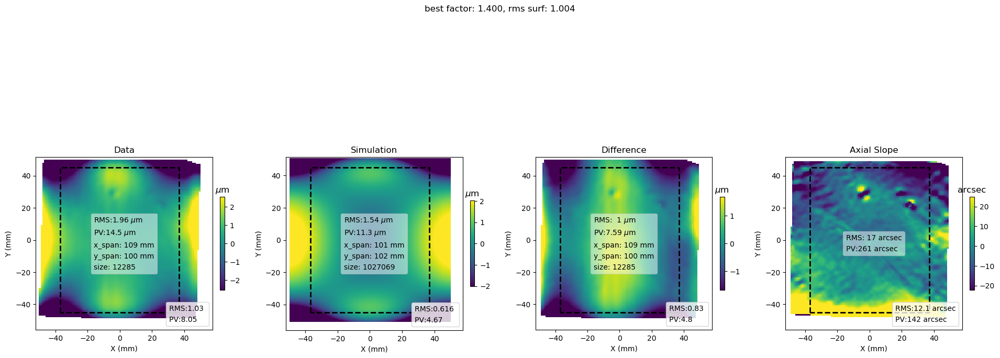

BEST SCALE: 1.400

===

FULL APERTURE
TEST RANGE: [1.92 2.  ]
unscaled fom: 1.2185415385392677
0 1.92 0.8781271645217286
1 1.93 0.8779707351867994
2 1.94 0.8779059389972694
3 1.95 0.8779327962422045
4 1.96 0.8780512985113033
5 1.97 0.8782614087080598
6 1.98 0.8785630611077934
7 1.99 0.8789561614603296
8 2.0 0.8794405871369644


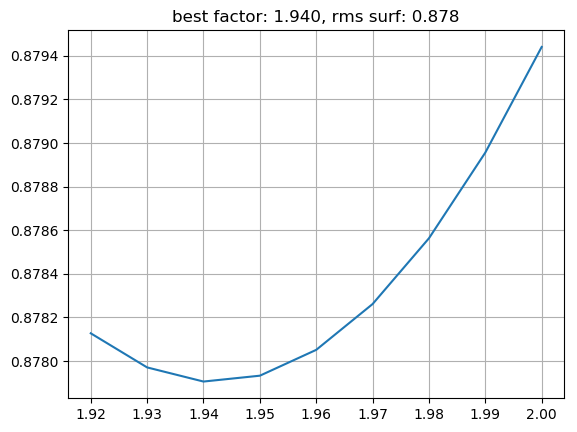

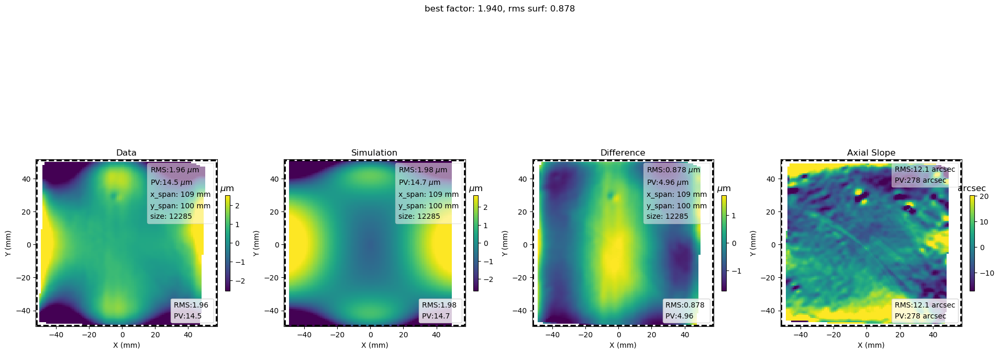

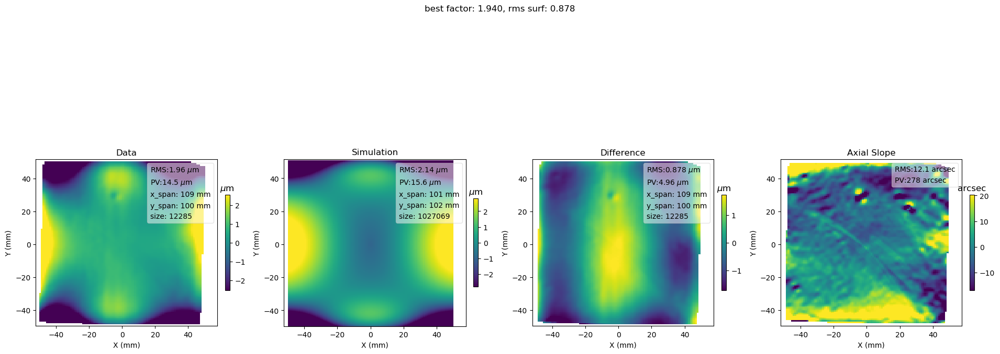

BEST SCALE: 1.940

===
SUMMARY:
CROP: [-10.00:10.00] [-45.00:45.00] --> BEST SCALE:  0.9
CROP: [-20.00:20.00] [-45.00:45.00] --> BEST SCALE:  0.67
CROP: [-30.00:30.00] [-45.00:45.00] --> BEST SCALE:  1.11
CROP: [-37.00:37.00] [-45.00:45.00] --> BEST SCALE:  1.4
FULL APERTURE--> BEST SCALE:  1.94


In [73]:
#FINE TUNING

scales=trioptimize(p1,df,fom=fom,testvals=[np.arange(0.88,0.92,0.01),
                                  np.arange(0.64,0.71,0.01),
                                  np.arange(1.09,1.14,0.01),
                                  np.arange(1.38,1.42,0.01),
                                  np.arange(1.92,2.0,0.01)],
           rois=[[[-10,10],[-45,45]],[[-20,20],[-45,45]],[[-30,30],[-45,45]],
                 [[-37,37],[-45,45]],None],
                  outfile=os.path.join(outfolder,'fits2','wfs_test_roi'))
allres=allres.append(scales)

This is a summary of results (first half from VK's simulation, 300 MPa um, second half for VM's, 150 MPa um)

In [74]:
allres[['tbest','rms_roi','roi']]

,tbest,rms_roi,roi
wfs_test_roi,0.48,0.205576,"[[-10, 10], [-45, 45]]"
wfs_test_roi,0.41,0.401202,"[[-20, 20], [-45, 45]]"
wfs_test_roi,0.74,0.674395,"[[-30, 30], [-45, 45]]"
wfs_test_roi,0.84,0.765710,"[[-37, 37], [-45, 45]]"
wfs_test_roi,1.02,0.800055,None
wfs_test_roi,0.90,0.212270,"[[-10, 10], [-45, 45]]"
wfs_test_roi,0.67,0.417291,"[[-20, 20], [-45, 45]]"
wfs_test_roi,1.11,0.722252,"[[-30, 30], [-45, 45]]"
wfs_test_roi,1.40,0.830354,"[[-37, 37], [-45, 45]]"
wfs_test_roi,1.94,0.877906,None


In [75]:
allres[['tbest','rms_roi','roi']].to_csv(os.path.join(outfolder,'all_stats_VKVM.txt'))

## Plot Best VM

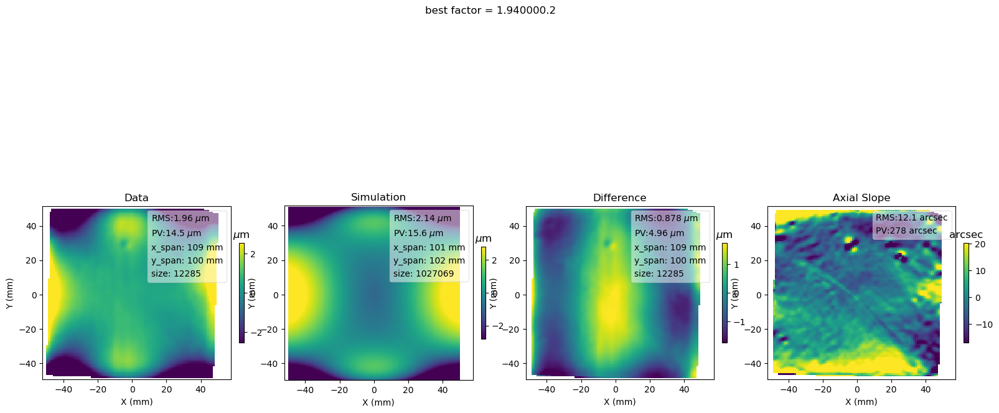

In [76]:
bf=1.94
plt.close('all')
comp2(p1,df*bf)
plt.suptitle('best factor = %F.2'%bf)
display(plt.gcf())

In [77]:
plt.savefig(os.path.join(outfolder,'best_fit_VM.png'))

## Compare finite element simulations

In [37]:
from pySurf.instrumentReader import points_reader, fitsWFS_reader, FEAreader
from pySurf.affine2D import plot_transform,find_rototrans
from pySurf.distanceTable import distanceTable
from pySurf.data2D_class import Data2D
from pySurf.data2D import resample_data

In [38]:
FEAf=r'G:\My Drive\Shared by Vincenzo\Metrology logs and data\Simulations\Coating_stress\VK20180619\coat_300_MPa_um_ur.fits'  #300 MPa*um load

In [39]:
plt.figure(2)
plt.clf()

#manually adjust x and y scales to 4 in, adjsut units and signs.

fdata,xf,yf=fitsWFS_reader(FEAf)  #can accept ypix, ytox,..
#xf,yf,fdata=yf,xf,fdata.T

fdata=fdata-correct_misalignment(fdata)[0]
fdata=-fdata*1000000.  #m to um  
#fitsWFS_reader makes a mysterious change of sign, that is good with WK's
#data that are bump negative conversion.

#scale and center axes (100 mm square image size)
nx=fdata.shape[0]
scale=101.6/nx
xf=(xf-span(xf).sum()/2)*scale
yf=(yf-span(yf).sum()/2)*scale

df=Data2D(fdata,xf,yf,units=['mm','mm','$\mu$m'],name='VK Simulation (cone)')
#rule is: corners have same sign as delta Radius

In [40]:
FEAf2=r'G:\My Drive\Shared by Vincenzo\Metrology logs and data\Simulations\CoatingStress_Analysis\220mm_CoatingStress\Primary\220mmROC_Case1_MirrorSurfaceOnly.csv'

In [44]:
plt.figure(2)
plt.clf()

#manually adjust x and y scales to 4 in, adjsut units and signs.

fdata,xf,yf=points_autoresample(FEAreader(FEAf2))  #can accept ypix, ytox,..
#xf,yf,fdata=yf,xf,fdata.T

fdata=fdata-correct_misalignment(fdata)[0]
fdata=fdata*1000.  #m to um  
#fitsWFS_reader makes a mysterious change of sign, that is good with WK's
#data that are bump negative conversion.

#scale and center axes (100 mm square image size)
nx=fdata.shape[0]
scale=1.016
xf=(xf-span(xf).sum()/2)*scale
yf=(yf-span(yf).sum()/2)*scale

df2=Data2D(fdata,xf,yf,units=['mm','mm','$\mu$m'],name='VM simulation 220mmROC_Case1_MirrorSurfaceOnly')
#rule is: corners have same sign as delta Radius

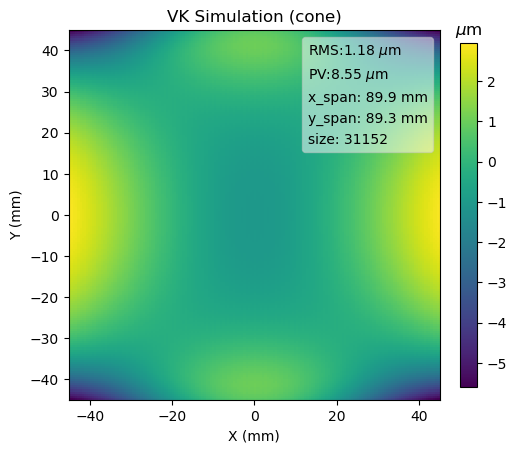

In [45]:
plt.close('all')
df=df.crop([-45,45],[-45,45]).level()
df.plot()
display(plt.gcf())


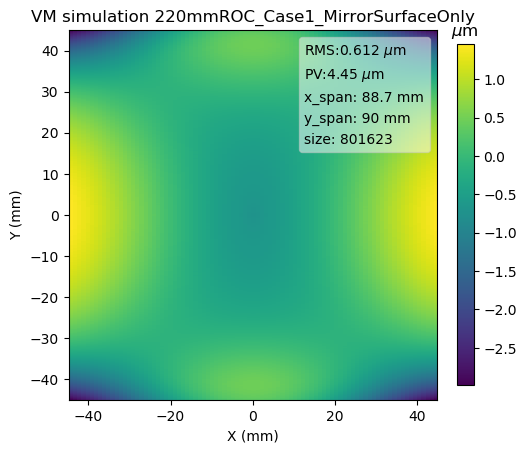

In [46]:
plt.figure()
df2=df2.crop([-45,45],[-45,45]).level()
df2.plot()
display(plt.gcf())

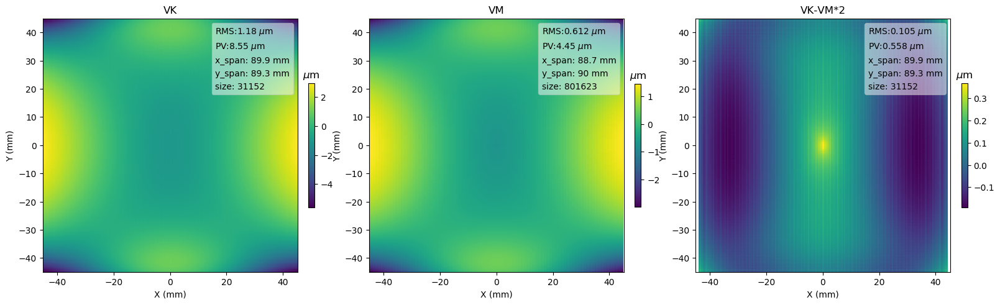

In [57]:
plt.figure()
maximize()

ax1=plt.subplot(131)
df.plot(title='VK')

plt.subplot(132,sharex=ax1,sharey=ax1)
(df2).plot(title='VM')


plt.subplot(133,sharex=ax1,sharey=ax1)
(df-df2*2).plot(title='VK-VM*2')

display(plt.gcf())
plt.savefig(os.path.join(outfolder,'FEAdiff_crop.png'))

In [58]:
plt.close('all')
